# Supercell Stenciling with `doped`

This tutorial demonstrates the **defect supercell stenciling** functionality in `doped`, which allows one to re-generate a (relaxed) defect structure in a different, arbitrary supercell. 

By reducing re-relaxation requirements and allowing the generation of specific local geometries in arbitrary supercells, this can yield large computational savings when investigating supercell size convergence / extrapolation behaviour, when you need to re-use existing calculations in a new simulation cell (e.g. to match a previous investigation etc.), for structure-searching (e.g. running [`ShakeNBreak`](https://shakenbreak.readthedocs.io/) relaxations in a smaller supercell to identify locally-stable defect configurations, before computing the subset of distinct structures in a larger fully-converged supercell etc.), or for other purposes.

This functionality is generally applicable to any other local structure perturbation beyond defects (e.g. polarons, self-trapped excitons etc.), allowing the local geometry to be transferred to a different supercell. The stenciling functionality lives in `doped.utils.stenciling`, and the primary user-facing function is `get_defect_in_supercell`.

```{note}
If you use the stenciling functions from ``doped`` in your work, please cite [_Energy & Environmental Science_ 2025](https://doi.org/10.1039/D4EE04647A) (where this approach was first developed and validated) in addition to the main canonical ``doped`` citation.
```

```{tip}
You can run this notebook interactively through [Google Colab](https://colab.research.google.com/github/SMTG-Bham/doped/blob/develop/examples/stenciling_tutorial.ipynb) or [Binder](https://mybinder.org/v2/gh/SMTG-Bham/doped/develop?urlpath=tree/examples/stenciling_tutorial.ipynb) – just click the links!
If running on Colab, then you'll need to run `!pip install doped` in a cell to install the package, and `!git clone https://github.com/SMTG-Bham/doped` to download the example data (and update paths in the code cells accordingly).
```

As a basic example, in the following figure, we show the convergence of the relative energies of $Te_i^0$ geometries (using [`ShakeNBreak`](https://shakenbreak.readthedocs.io/en/latest/)) in CdTe as a function of supercell size, investigated in [Point defect formation at finite temperatures with machine learning force fields](https://doi.org/10.1039/D4SC08582E) using a MACE model trained on PBEsol calculations.

Here, the 'unperturbed' structures correspond to $Te_i$ coordinated by Cd atoms (which is a less favourable interstitial site -- [Accurately Modelling Point Defects in Semiconductors: The Case of CdTe](https://discovery.ucl.ac.uk/id/eprint/10186130/)), while most of the SnB rattled/distorted structures result in the lower energy $Te_i$-coordinated-by-Te geometries. We see that stenciling the relaxed, lowest-energy $Te_i$ structure from the 13 Å 2x2x2 supercell into the 3x3x3 or 4x4x4 supercells ("Regenerated") yields the lowest-energy geometry for the expanded supercells, as expected (with less ionic steps and in theory avoiding the need to re-do SnB structure-searching in the larger supercells).

<img src="../docs/Images/Irea_SnB_Te_i_0_Supercell_Convergence_MACE_PBEsol.png"/>

## 1. Why Stencil Defect Supercells?

A key concern in defect supercell calculations is convergence of the total energy difference (and hence formation energy) with respect to supercell size. Finite-size effects arise because the periodic images of the defect interact with each other, and these effects decay with increasing supercell size. This means that in practice, one often needs to check that a chosen supercell is large enough that the computed properties are converged.

Running full DFT geometry optimisations for the same defect in multiple supercell sizes is computationally expensive, especially when hybrid-functional calculations are required for accurate defect formation energies. **Defect supercell stenciling** can offer a practical shortcut: given a relaxed defect supercell from one size, stenciling reconstructs an approximate relaxed geometry in the target supercell by:

- Preserving as much as possible of the local atomic geometry around the defect directly from the relaxed structure.
- Filling in the additional atoms in the larger cell (or trimming atoms if going to a smaller cell) using the bulk positions.

The resulting stenciled structure is an excellent starting point for a final geometry optimisation in the new supercell, often requiring fewer ionic steps than starting from the unrelaxed bulk or a randomly rattled structure and, importantly, ensuring that the same defect geometry is obtained (rather than e.g. a different metastable configuration).

**Typical use cases:**

- **Supercell size convergence testing**: quickly obtain approximate defect structures in larger (or
  smaller) supercells, to accelerate size convergence tests.
- **Accelerating `ShakeNBreak` structure searching**: instead of generating many rattled/displaced
  structures from scratch in a new supercell, stencil the already-found low-energy configurations and
  do short relaxations from those.
- **Comparing to previous studies**: stencil computed defect structures to match the supercell size/shape of a previous study, to directly compare results etc.
- **Other applications**: stenciling can be applied to any other local structure perturbation beyond defects (e.g. polarons, self-trapped excitons etc.), allowing the local geometry to be transferred to a different supercell.

```{important}
The stenciled supercell is an **approximate** relaxed structure: it faithfully reproduces the local defect geometry (neighbour distances, bond angles etc.) from the original calculation, but atoms near the supercell _boundary_ may have small residual displacements from the true relaxed positions (due to changes in defect periodicity due to different supercell sizes/shapes). It should therefore be used as a **starting point** for a (typically short) final geometry optimisation, rather than treated as fully converged. For sufficiently large source and target supercells, the required relaxation steps are minimal.
```

In [4]:
%matplotlib inline
from copy import deepcopy

import matplotlib.pyplot as plt
from ase.visualize.plot import plot_atoms
from pymatgen.core.structure import Structure
import numpy as np

from doped.analysis import DefectParser, defect_site_from_structures
from doped.thermodynamics import DefectThermodynamics
from doped.utils.displacements import plot_site_displacements
from doped.utils.stenciling import get_defect_in_supercell

### Helper functions

We define some helper functions used throughout this tutorial:

- `make_stenciled_defect_entry`: replaces the defect/bulk supercells of a `DefectEntry` object to allow easy displacement-plotting for the unrelaxed stenciled structures.
- `plot_stenciled_vs_original_displacements`: produces a side-by-side comparison of site displacements
  for the stenciled and original structures.
- `show_structures`: shows the original and stenciled defect supercells side by side as 2D ball-and-stick
  plots using ASE `plot_atoms` and `matplotlib`.
- `print_structure_comparison`: prints a concise comparison of lattice parameters and compositions for the original, target, and stenciled supercells.

In [5]:
def make_stenciled_defect_entry(defect_entry, stenciled_supercell, corresponding_bulk):
    """
    Create a copy of ``defect_entry`` with its ``defect_supercell`` and
    ``bulk_supercell`` replaced by the stenciled structures, for use with
    displacement plotting functions.
    """
    stenciled_entry = deepcopy(defect_entry)
    stenciled_entry.defect_supercell = stenciled_supercell
    stenciled_entry.bulk_supercell = corresponding_bulk
    (
        defect_site,
        _defect_type,
        defect_site_in_bulk,
        _defect_site_index,
        bulk_site_index,
        _unrelaxed_defect_structure,
    ) = defect_site_from_structures(stenciled_supercell, corresponding_bulk, return_all_info=True)
    stenciled_entry.defect_supercell_site = defect_site
    stenciled_entry.sc_defect_frac_coords = defect_site.frac_coords
    stenciled_entry.calculation_metadata.pop("site_displacements", None)
    stenciled_entry.calculation_metadata["bulk_site"] = (
        defect_site_in_bulk if bulk_site_index is None else corresponding_bulk[bulk_site_index]
    )
    return stenciled_entry


def plot_stenciled_vs_original_displacements(stenciled_entry, original_entry):
    """
    Create a 1x2 figure comparing site displacements of the original DFT
    defect entry (left) against the stenciled defect entry (right).
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
    for ax, entry, title in zip(axes, [original_entry, stenciled_entry], ["Original DFT", "Stenciled"]):
        plot_site_displacements(entry, ax=ax)
        ax.set_title(title, fontsize=14)
    axes[1].set_ylabel("")
    axes[1].get_legend().remove()
    fig.subplots_adjust(wspace=0.15)
    for ax in axes:
        ax.set(xlim=[np.min([ax.get_xlim() for ax in axes]), np.max([ax.get_xlim() for ax in axes])])
    return fig


def show_structures(original_supercell, stenciled_supercell, radii=0.4, **kwargs):
    """
    Show the original and stenciled defect supercells side by side as 2D
    ball-and-stick plots (ASE ``plot_atoms`` + matplotlib).
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
    plot_atoms(original_supercell.to_ase_atoms(), ax=axes[0], radii=radii, **kwargs)
    plot_atoms(stenciled_supercell.to_ase_atoms(), ax=axes[1], radii=radii, **kwargs)
    axes[0].set_title("Original DFT supercell", fontsize=12, fontweight="bold")
    axes[1].set_title("Stenciled supercell", fontsize=12, fontweight="bold")
    fig.tight_layout()
    return fig


def print_structure_comparison(original_supercell, target_supercell, stenciled_supercell, defect_name):
    """
    Print a concise comparison of lattice parameters and compositions for the
    original, target, and stenciled supercells.
    """
    orig_lat = original_supercell.lattice
    tgt_lat = target_supercell.lattice
    sten_lat = stenciled_supercell.lattice

    print(f"Stenciling {defect_name}")
    print("=" * 65)
    print(f"{'Property':<20} {'Original':>14} {'Target':>14} {'Stenciled':>14}")
    print("-" * 65)
    print(
        f"{'# atoms':<20} {len(original_supercell):>14d} {len(target_supercell):>14d} "
        f"{len(stenciled_supercell):>14d}"
    )
    print(f"{'a (Å)':<20} {orig_lat.a:>14.3f} {tgt_lat.a:>14.3f} {sten_lat.a:>14.3f}")
    print(f"{'b (Å)':<20} {orig_lat.b:>14.3f} {tgt_lat.b:>14.3f} {sten_lat.b:>14.3f}")
    print(f"{'c (Å)':<20} {orig_lat.c:>14.3f} {tgt_lat.c:>14.3f} {sten_lat.c:>14.3f}")
    print(f"{'α (°)':<20} {orig_lat.alpha:>14.3f} {tgt_lat.alpha:>14.3f} {sten_lat.alpha:>14.3f}")
    print(f"{'β (°)':<20} {orig_lat.beta:>14.3f} {tgt_lat.beta:>14.3f} {sten_lat.beta:>14.3f}")
    print(f"{'γ (°)':<20} {orig_lat.gamma:>14.3f} {tgt_lat.gamma:>14.3f} {sten_lat.gamma:>14.3f}")
    print(
        f"{'Composition':<20} {str(original_supercell.composition):>14} "
        f"{str(target_supercell.composition):>14} "
        f"{str(stenciled_supercell.composition):>14}"
    )

## 2. Stenciling Defects in $t$-Se

In this example, we stencil defects from the original ~13 Å supercell (81 atoms) into a 20 Å supercell (234 atoms), for point defects in trigonal selenium (_t_-Se); as performed in [_Energy & Environmental Science_ 2025](https://doi.org/10.1039/D4EE04647A) to confirm convergence of defect formation energies with respect to supercell size. 

```{note}
These stenciled structures were explicitly validated by performing hybrid DFT relaxations from the stenciled geometries. In this case, taking `ShakeNBreak` ground-state geometries from the 81-atom supercell was found, in a few cases, to return _lower-energy_ structures (the same local geometry as the 81-atom cell) than obtained from a rattled relaxation in the 234-atom cell (where rattled relaxation in the 81-atom cell was sufficient, to identify the symmetry-broken distorted ground-state). This is thought to be the result of greater resistance to deformation in the larger supercells, with greater initial restoring forces to minimise bulk strain rather than defect distortion, along with more degrees of freedom at play.
```

### Load Se defect data

We use pre-computed Se thermodynamics objects and target supercell POSCAR files from the `doped` examples
directory. The original Se defect supercell has dimensions ~13.0 × 13.0 × 14.9 Å (81 atoms).

In [6]:
# Load Se thermodynamics objects (intrinsic + extrinsic defect entries)
Se_intrinsic_thermo = DefectThermodynamics.from_json("Se/Se_Intrinsic_Thermo.json.gz")
Se_extrinsic_thermo = DefectThermodynamics.from_json("Se/Se_Amalgamated_Extrinsic_Thermo.json.gz")

In [7]:
# Load target supercell POSCARs:
# 20 Å supercell (~20.5 x 20.0 x 20.3 Å, 234 atoms); generated via 
# DefectsGenerator(prim_Se, supercell_gen_kwargs={"min_dist": 20}) (or get_ideal_supercell_matrix(prim_Se, 20)):
Se_20A_bulk_supercell = Structure.from_file("Se/Se_20Å_Supercell_POSCAR")

# Inspect original Se defect supercell dimensions:
orig_entry = Se_intrinsic_thermo.defect_entries["vac_1_Se_0"]
orig_sc = orig_entry.defect_supercell
print(f"Original Se defect supercell: {len(orig_sc)} atoms, "
      f"a={orig_sc.lattice.a:.1f} Å, b={orig_sc.lattice.b:.1f} Å, c={orig_sc.lattice.c:.1f} Å")
print(f"20 Å target supercell:        {len(Se_20A_bulk_supercell)} atoms, "
      f"a={Se_20A_bulk_supercell.lattice.a:.1f} Å, b={Se_20A_bulk_supercell.lattice.b:.1f} Å, "
      f"c={Se_20A_bulk_supercell.lattice.c:.1f} Å")

Original Se defect supercell: 80 atoms, a=13.0 Å, b=13.0 Å, c=14.9 Å
20 Å target supercell:        234 atoms, a=20.5 Å, b=20.0 Å, c=20.3 Å


### 2.1 Selenium Vacancy: $V_{Se}^0$

Let's use the neutral Selenium vacancy as a first example.

In [8]:
v_Se_0_entry = Se_intrinsic_thermo.defect_entries["vac_1_Se_0"]  # old doped naming format

# Stencil the relaxed v_Se_0 structure into the 20 Å supercell:
stenciled_v_Se_0_20A, bulk_v_Se_0_20A = get_defect_in_supercell(
    v_Se_0_entry,
    Se_20A_bulk_supercell,
)

# Compare original vs stenciled structures:
print_structure_comparison(
    v_Se_0_entry.defect_supercell,
    Se_20A_bulk_supercell,
    stenciled_v_Se_0_20A,
    defect_name="v_Se_0 → 20 Å supercell",
)
# One can save the stenciled structure with stenciled_v_Se_0_20A.to('POSCAR')
# and visualise with VESTA/CrystalMaker

Placing defect closest to target_frac_coords: 100.0%|██████████| [00:00,  152.79it/s]                

Stenciling v_Se_0 → 20 Å supercell
Property                   Original         Target      Stenciled
-----------------------------------------------------------------
# atoms                          80            234            233
a (Å)                        13.033         20.517         20.517
b (Å)                        13.033         20.013         20.013
c (Å)                        14.891         20.324         20.324
α (°)                        90.000         66.935         66.935
β (°)                        90.000         99.697         99.697
γ (°)                       120.000         64.434         64.434
Composition                    Se80          Se234          Se233


Note that the composition of the stenciled supercell is `Se233`, corresponding to a Se vacancy in the 234-atom target (bulk) supercell. Let's visualise the relaxed defect supercell before and after stenciling:

In [6]:
# let's first translate the defect to the centre of the original cell, to aid visualisation:
import numpy as np
v_Se_0_w_defect_at_centre = v_Se_0_entry.defect_supercell.copy()
v_Se_0_w_defect_at_centre = v_Se_0_w_defect_at_centre.translate_sites(
    list(range(len(v_Se_0_w_defect_at_centre))),
    np.array([0.5, 0.5, 0.5]) - v_Se_0_entry.defect_supercell_site.frac_coords)


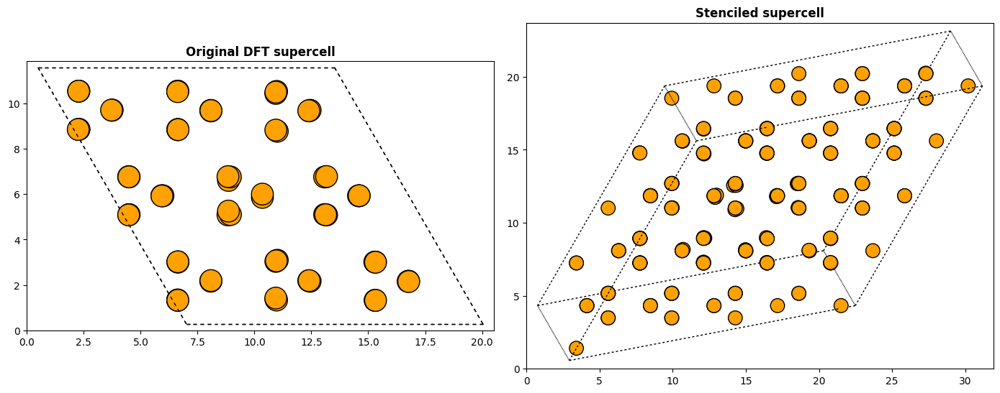

In [7]:
structure_fig = show_structures(v_Se_0_w_defect_at_centre, stenciled_v_Se_0_20A)  # looking down c-axis

We can also use the excellent [`pymatviz`](https://github.com/janosh/pymatviz) package to get an interactive visualisation of the stenciled structure:

In [ ]:
# !pip install pymatviz  # if not already installed!
from pymatviz.widgets import StructureWidget
StructureWidget(stenciled_v_Se_0_20A)

It's not the most obvious here, but we can see that the vacancy perturbs one trigonal Se chain (on which it lies) and neighbouring chains to a lesser extent. As expected, we see this same perturbation, in the stenciled supercell, with the atomic displacements decaying away from the defect.

For a more quantitative analysis, let's let's compare the site displacement patterns of the original and stenciled supercells:

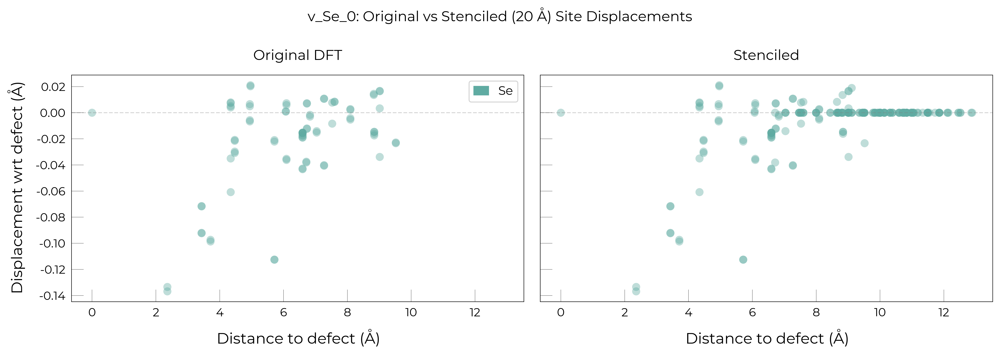

In [14]:
stenciled_v_Se_0_20A_entry = make_stenciled_defect_entry(
    v_Se_0_entry, stenciled_v_Se_0_20A, bulk_v_Se_0_20A
)
fig = plot_stenciled_vs_original_displacements(stenciled_v_Se_0_20A_entry, v_Se_0_entry)
fig.suptitle("v_Se_0: Original vs Stenciled (20 Å) Site Displacements", fontsize=14)
plt.tight_layout()
plt.show()

As expected, the site displacements (relative to the bulk/pristine structure) near the defect match exactly between the original and stenciled supercells, confirming that the local geometry of the vacancy has been faithfully reproduced. There are some minor differences near the original cell boundary (~9-10 Å from the defect site) as expected, along with the additional sites at the bulk positions (thus having zero displacement magnitudes) far away from the defect in the stenciled supercell.

### 2.2 Selenium Vacancy using ``Structure`` Inputs

We can also use just ``Structure`` objects as inputs for ``get_defect_in_supercell``, rather than ``DefectEntry`` objects, if we haven't already parsed the defect calculations:

In [ ]:
# Stencil the relaxed v_Se_0 structure into the 20 Å supercell, using just Structure objects:
stenciled_v_Se_0_20A, bulk_v_Se_0_20A = get_defect_in_supercell(
    (v_Se_0_entry.defect_supercell, v_Se_0_entry.bulk_supercell),  # Structure inputs, can also optionally specify defect site frac_coords to skip auto-determination
    Se_20A_bulk_supercell,
)
print_structure_comparison(  # Compare original vs stenciled structures
    v_Se_0_entry.defect_supercell,
    Se_20A_bulk_supercell,
    stenciled_v_Se_0_20A,
    defect_name="v_Se_0 → 20 Å supercell",
)

Placing defect closest to target_frac_coords: 100.0%|██████████| [00:00,  146.13it/s]                

Stenciling v_Se_0 → 20 Å supercell
Property                   Original         Target      Stenciled
-----------------------------------------------------------------
# atoms                          80            234            233
a (Å)                        13.033         20.517         20.517
b (Å)                        13.033         20.013         20.013
c (Å)                        14.891         20.324         20.324
α (°)                        90.000         66.935         66.935
β (°)                        90.000         99.697         99.697
γ (°)                       120.000         64.434         64.434
Composition                    Se80          Se234          Se233


### 2.3 Se Interstitial: $Se_i^{-2}$

The doubly-negative Se interstitial is a more challenging case: it cause the rupturing of the Se chain and formation of two bridging bonds by the terminated ends with neighbouring chains (to stabilise the additional electronic charge), which causes greater site displacements further from the defect site.

In [9]:
Se_i_C2_m2_entry = Se_intrinsic_thermo.defect_entries["Int_Se_1_-2"]  # old doped naming format

# Stencil into the 20 Å supercell:
stenciled_Se_i_m2_20A, bulk_Se_i_m2_20A = get_defect_in_supercell(
    Se_i_C2_m2_entry,
    Se_20A_bulk_supercell,
)

Placing defect closest to target_frac_coords: 100.0%|██████████| [00:04,  20.56it/s]                                


Due to the greater site displacements further from the defect site (and thus near the cell bounaries), the stenciling algorithm has to scan over more cell edge and minimum distance tolerances, to find the best possible stenciling (which minimises strain/displacement near the original cell boundary). Stenciling takes slightly longer as a result, but still succeeds without issue, faithfully reproducing the local geometry of the interstitial defect:

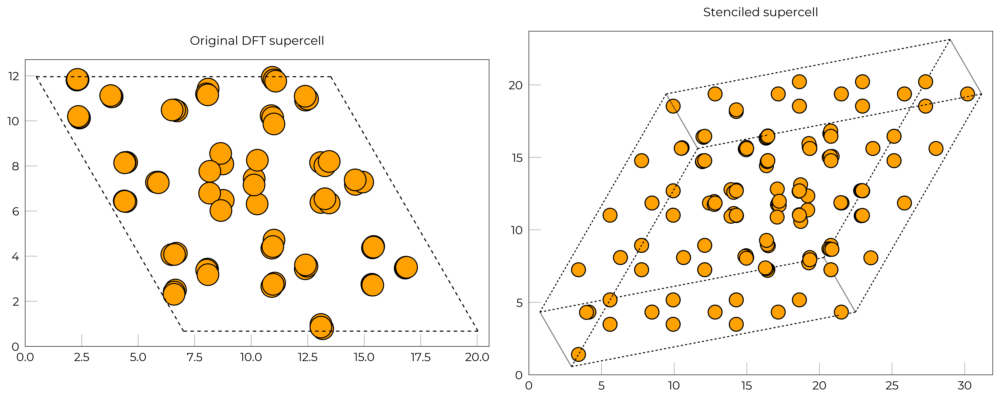

In [11]:
# let's translate the defect to the centre of the original cell, to aid visualisation:
import numpy as np
Se_i_C2_m2_w_defect_at_centre = Se_i_C2_m2_entry.defect_supercell.copy()
Se_i_C2_m2_w_defect_at_centre = Se_i_C2_m2_w_defect_at_centre.translate_sites(
    list(range(len(Se_i_C2_m2_w_defect_at_centre))),
    np.array([0.5, 0.5, 0.5]) - Se_i_C2_m2_entry.defect_supercell_site.frac_coords)

structure_fig = show_structures(Se_i_C2_m2_w_defect_at_centre, stenciled_Se_i_m2_20A)

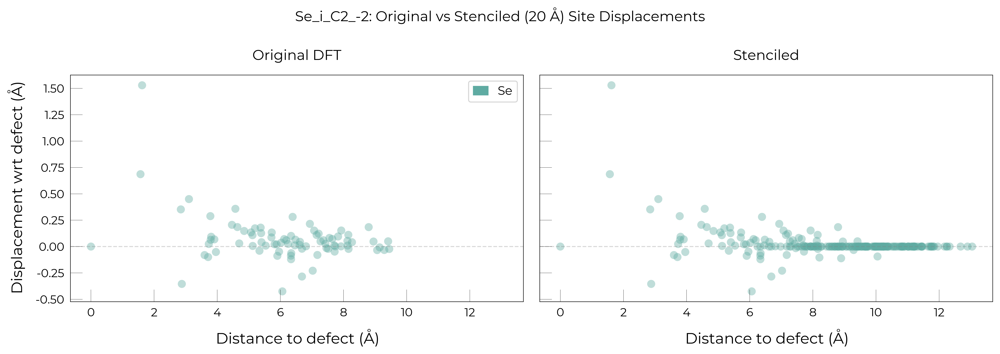

In [15]:
stenciled_Se_i_m2_20A_entry = make_stenciled_defect_entry(
    Se_i_C2_m2_entry, stenciled_Se_i_m2_20A, bulk_Se_i_m2_20A
)
fig = plot_stenciled_vs_original_displacements(stenciled_Se_i_m2_20A_entry, Se_i_C2_m2_entry)
fig.suptitle("Se_i_C2_-2: Original vs Stenciled (20 Å) Site Displacements", fontsize=14)
plt.tight_layout()
plt.show()

### 2.4 H Substitution on Se: $H_{Se}^{-1}$

Here we stencil an extrinsic (impurity) defect — a hydrogen atom sitting on a Se site — demonstrating
that stenciling works equally well for substitutional extrinsic defects.

In [16]:
H_Se_m1_entry = Se_extrinsic_thermo.defect_entries["sub_1_H_on_Se_-1"]  # old doped naming format

stenciled_H_Se_m1_20A, bulk_H_Se_m1_20A = get_defect_in_supercell(
    H_Se_m1_entry,
    Se_20A_bulk_supercell,
)

print_structure_comparison(
    H_Se_m1_entry.defect_supercell,
    Se_20A_bulk_supercell,
    stenciled_H_Se_m1_20A,
    defect_name="H_Se_-1 → 20 Å supercell",
)

Placing defect closest to target_frac_coords: 100.0%|██████████| [00:01,  67.87it/s]                 

Stenciling H_Se_-1 → 20 Å supercell
Property                   Original         Target      Stenciled
-----------------------------------------------------------------
# atoms                          81            234            234
a (Å)                        13.033         20.517         20.517
b (Å)                        13.033         20.013         20.013
c (Å)                        14.891         20.324         20.324
α (°)                        90.000         66.935         66.935
β (°)                        90.000         99.697         99.697
γ (°)                       120.000         64.434         64.434
Composition                 H1 Se80          Se234       H1 Se233


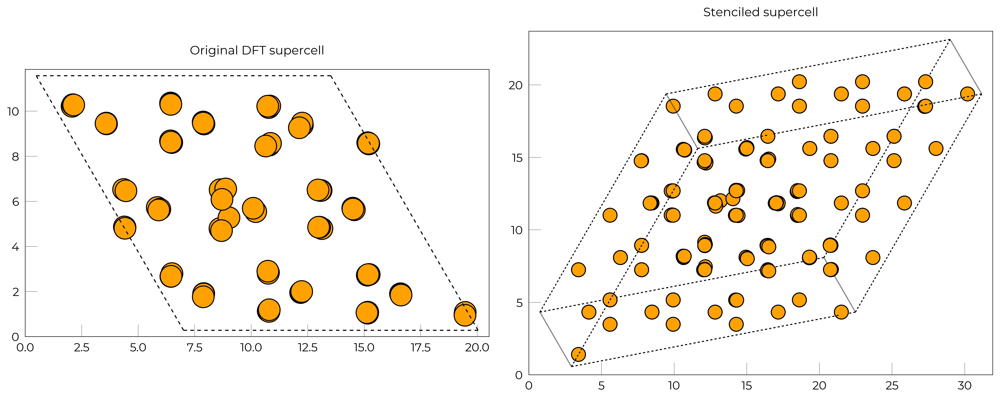

In [17]:
# let's translate the defect to the centre of the original cell, to aid visualisation:
import numpy as np
H_Se_m1_w_defect_at_centre = H_Se_m1_entry.defect_supercell.copy()
H_Se_m1_w_defect_at_centre = H_Se_m1_w_defect_at_centre.translate_sites(
    list(range(len(H_Se_m1_w_defect_at_centre))),
    np.array([0.5, 0.5, 0.5]) - H_Se_m1_entry.defect_supercell_site.frac_coords)

structure_fig = show_structures(H_Se_m1_w_defect_at_centre, stenciled_H_Se_m1_20A)

In [ ]:
StructureWidget(stenciled_H_Se_m1_20A)

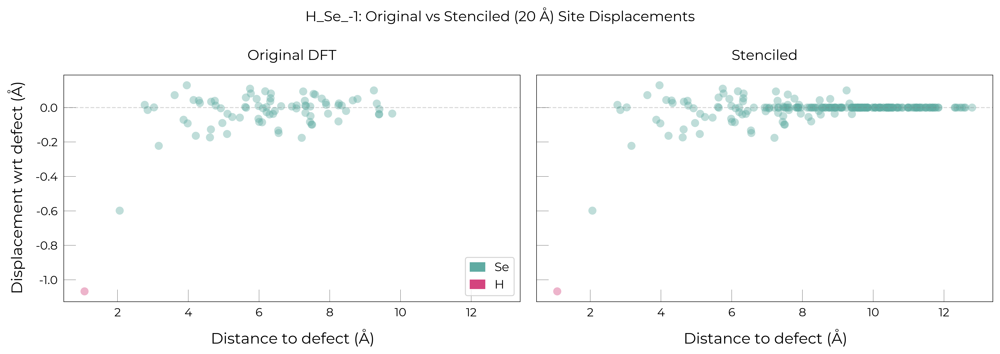

In [18]:
stenciled_H_Se_m1_20A_entry = make_stenciled_defect_entry(
    H_Se_m1_entry, stenciled_H_Se_m1_20A, bulk_H_Se_m1_20A
)
fig = plot_stenciled_vs_original_displacements(stenciled_H_Se_m1_20A_entry, H_Se_m1_entry)
fig.suptitle("H_Se_-1: Original vs Stenciled (20 Å) Site Displacements", fontsize=14)
plt.tight_layout()
plt.show()

### 2.5 Selenium Vacancy: $V_{Se}^0$ in 5000-atom Supercell

As a quick example, we demonstrate here the stenciling of the $V_{Se}^0$ defect into a >5000-atom
supercell; specifically, a 4x4x4 supercell of the original ~13 Å cell (81 atoms), which gives a 5184-atom supercell with ~52 Å lattice parameters.

In [7]:
v_Se_0_entry = Se_intrinsic_thermo.defect_entries["vac_1_Se_0"]  # old doped naming format
target_supercell = v_Se_0_entry.bulk_supercell * 4  # 4x4x4 supercell of the original ~13 Å cell
print(f"Target 4x4x4 supercell: {len(target_supercell)} atoms, "
      f"a={target_supercell.lattice.a:.1f} Å, b={target_supercell.lattice.b:.1f} Å, "
      f"c={target_supercell.lattice.c:.1f} Å")

stenciled_v_Se_0_444_cell, bulk_v_Se_0_444_cell = get_defect_in_supercell(
    v_Se_0_entry,
    target_supercell,
)

# Compare original vs stenciled structures:
print_structure_comparison(
    v_Se_0_entry.defect_supercell,
    target_supercell,
    stenciled_v_Se_0_444_cell,
    defect_name="v_Se_0 → 4x4x4 supercell",
)
# One can save the stenciled structure with stenciled_v_Se_0_444_cell.to('POSCAR')
# and visualise with VESTA/CrystalMaker

Target 4x4x4 supercell: 5184 atoms, a=52.1 Å, b=52.1 Å, c=59.6 Å


Placing defect closest to target_frac_coords: 100.0%|██████████| [00:20,   4.80it/s]                 

Stenciling v_Se_0 → 4x4x4 supercell
Property                   Original         Target      Stenciled
-----------------------------------------------------------------
# atoms                          80           5184           5183
a (Å)                        13.033         52.131         52.131
b (Å)                        13.033         52.131         52.131
c (Å)                        14.891         59.563         59.563
α (°)                        90.000         90.000         90.000
β (°)                        90.000         90.000         90.000
γ (°)                       120.000        120.000        120.000
Composition                    Se80         Se5184         Se5183


We see that the stenciling process takes much longer due to the extreme cell size and thus much heavier computational load (for distance calculations, symmetry operations, etc.).

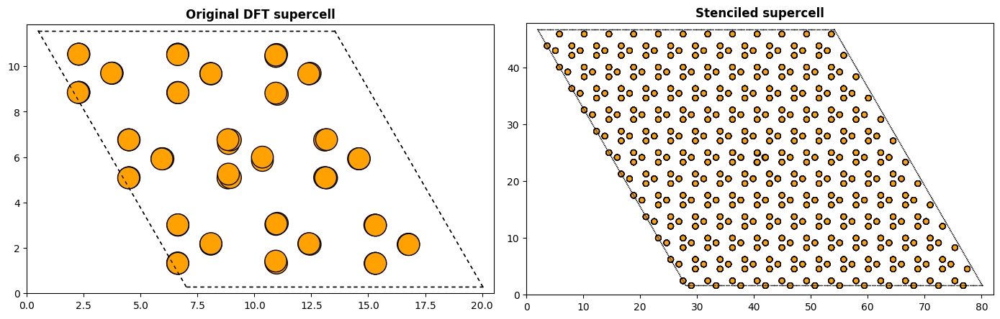

In [8]:
import numpy as np
v_Se_0_w_defect_at_centre = v_Se_0_entry.defect_supercell.copy()
v_Se_0_w_defect_at_centre = v_Se_0_w_defect_at_centre.translate_sites(
    list(range(len(v_Se_0_w_defect_at_centre))),
    np.array([0.5, 0.5, 0.5]) - v_Se_0_entry.defect_supercell_site.frac_coords)

structure_fig = show_structures(v_Se_0_w_defect_at_centre, stenciled_v_Se_0_444_cell)  # looking down c-axis

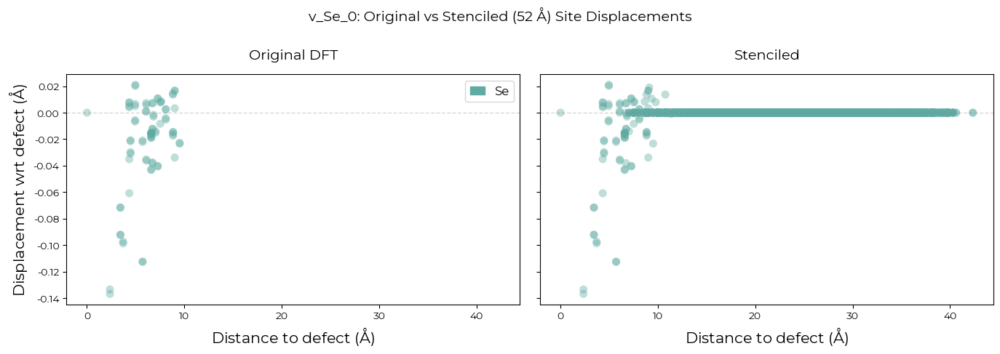

In [9]:
stenciled_v_Se_0_444_entry = make_stenciled_defect_entry(
    v_Se_0_entry, stenciled_v_Se_0_444_cell, bulk_v_Se_0_444_cell
)
fig = plot_stenciled_vs_original_displacements(stenciled_v_Se_0_444_entry, v_Se_0_entry)
fig.suptitle("v_Se_0: Original vs Stenciled (52 Å) Site Displacements", fontsize=14)
plt.tight_layout()
plt.show()

## 3. MgO: Stenciling `Mg_O_+2` to a Different Supercell Shape

Stenciling is robust to differences in supercell shape and lattice parameter, provided the target
supercell is large enough to encompass the defect local geometry. Here we demonstrate stenciling the
`Mg_O_+2` antisite defect from a _cubic_ 12 Å supercell into an _FCC-like_ supercell with ~62.5° angles and 15 Å minimum image distance.

In [ ]:
from doped.generation import get_ideal_supercell_matrix

# Parse the MgO Mg_O_+2 defect calculation to get the DefectEntry:
mgo_dp = DefectParser.from_paths(
    defect_path="MgO/Defects/Pre_Calculated_Results/Mg_O_+2/vasp_std",
    bulk_path="MgO/Defects/Pre_Calculated_Results/MgO_bulk/vasp_std",
    dielectric=8.8963,
)
mgo_entry = mgo_dp.defect_entry
print(f"Parsed: {mgo_entry.name}")

# Build the FCC-like 15 Å MgO target supercell from the primitive MgO cell:
prim_MgO = Structure.from_file("MgO/Input_files/prim_struc_POSCAR")
target_MgO_supercell = prim_MgO * get_ideal_supercell_matrix(structure=prim_MgO, min_image_distance=15)

orig_sc = mgo_entry.defect_supercell
print(
    f"\nOriginal MgO defect supercell: {len(orig_sc)} atoms, "
    f"angles: α={orig_sc.lattice.alpha:.1f}°, β={orig_sc.lattice.beta:.1f}°, γ={orig_sc.lattice.gamma:.1f}°"
)
print(
    f"Target MgO supercell:          {len(target_MgO_supercell)} atoms, "
    f"angles: α={target_MgO_supercell.lattice.alpha:.1f}°, β={target_MgO_supercell.lattice.beta:.1f}°, "
    f"γ={target_MgO_supercell.lattice.gamma:.1f}°"
)

Multiple `OUTCAR` files found in defect directory: /Users/kavanase/Packages/doped/examples/MgO/Defects/Pre_Calculated_Results/Mg_O_+2/vasp_std. Using OUTCAR to parse core levels and compute the Kumagai (eFNV) image charge correction.



Parsed: Mg_O_+2

Original MgO defect supercell: 216 atoms, angles: α=90.0°, β=90.0°, γ=90.0°
Target MgO supercell:          280 atoms, angles: α=62.5°, β=62.5°, γ=62.5°


In [11]:
# Stencil Mg_O_+2 into the FCC-like 15 Å MgO supercell:
stenciled_MgO, bulk_MgO = get_defect_in_supercell(
    mgo_entry,
    target_MgO_supercell,
)

print_structure_comparison(
    mgo_entry.defect_supercell,
    target_MgO_supercell,
    stenciled_MgO,
    defect_name="Mg_O_+2 → FCC-like 15 Å MgO supercell",
)

Placing defect closest to target_frac_coords: 100.0%|██████████| [00:02,  42.21it/s]                 

Stenciling Mg_O_+2 → FCC-like 15 Å MgO supercell
Property                   Original         Target      Stenciled
-----------------------------------------------------------------
# atoms                         216            280            280
a (Å)                        12.600         15.122         15.122
b (Å)                        12.600         15.122         15.122
c (Å)                        12.600         15.122         15.122
α (°)                        90.000         62.514         62.514
β (°)                        90.000         62.514         62.514
γ (°)                        90.000         62.514         62.514
Composition              Mg109 O107     Mg140 O140     Mg141 O139


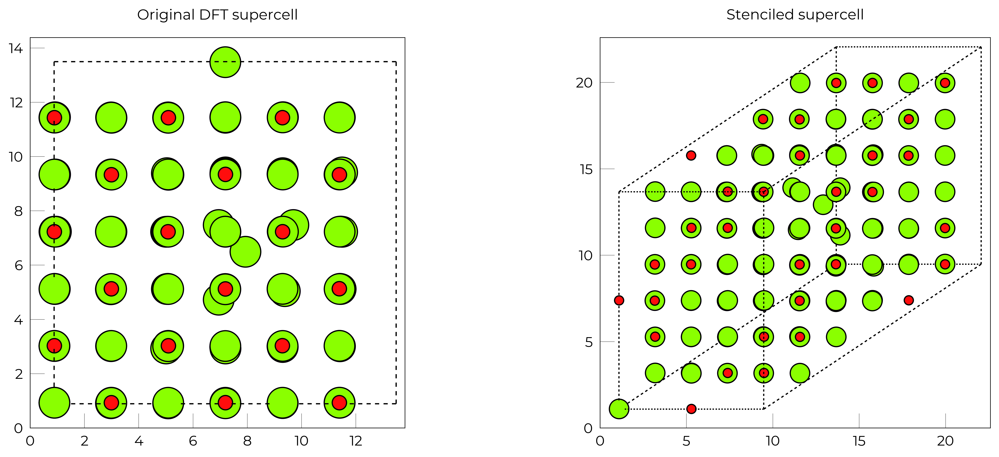

In [13]:
structure_fig = show_structures(mgo_entry.defect_supercell, stenciled_MgO)

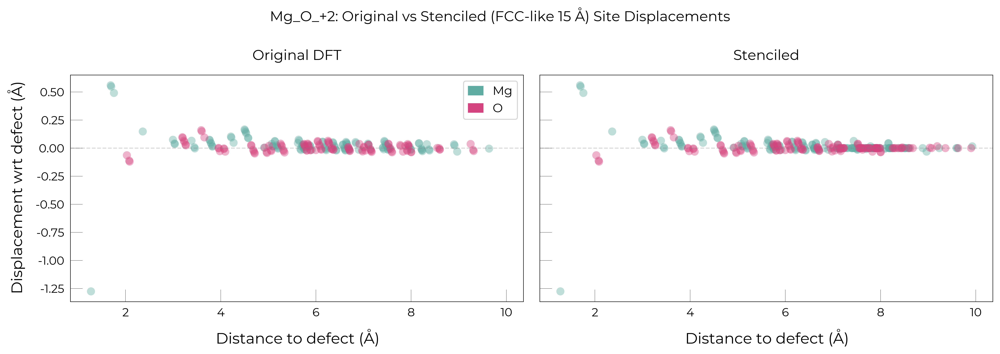

In [14]:
stenciled_MgO_entry = make_stenciled_defect_entry(mgo_entry, stenciled_MgO, bulk_MgO)
fig = plot_stenciled_vs_original_displacements(stenciled_MgO_entry, mgo_entry)
fig.suptitle(
    "Mg_O_+2: Original vs Stenciled (FCC-like 15 Å) Site Displacements", fontsize=14
)
plt.tight_layout()
plt.show()

Despite the different supercell shape and lattice angles, the stenciling algorithm correctly reproduces
the local geometry of the Mg antisite, as evidenced by the very similar displacement patterns, and structure visualisation.

## 4. MgO: Stenciling `Mg_O_+2` to a _Smaller_ Supercell

As well as stenciling a (relaxed) defect structure into larger supercell, we can also stencil into smaller supercells – in fact, we can stencil between any arbitrary choice of (realistic) supercells.

Here we show a quick example of stenciling the `Mg_O_+2` defect from the original ~12 Å supercell into a smaller ~8 Å supercell.

In [16]:
# Build a smaller, 8 Å MgO target supercell from the primitive MgO cell:
prim_MgO = Structure.from_file("MgO/Input_files/prim_struc_POSCAR")
target_MgO_supercell = prim_MgO * get_ideal_supercell_matrix(structure=prim_MgO, min_image_distance=8)

orig_sc = mgo_entry.defect_supercell
print(
    f"Original MgO defect supercell: {len(orig_sc)} atoms, "
    f"angles: α={orig_sc.lattice.alpha:.1f}°, β={orig_sc.lattice.beta:.1f}°, γ={orig_sc.lattice.gamma:.1f}°"
)
print(
    f"Target MgO supercell:          {len(target_MgO_supercell)} atoms, "
    f"angles: α={target_MgO_supercell.lattice.alpha:.1f}°, β={target_MgO_supercell.lattice.beta:.1f}°, "
    f"γ={target_MgO_supercell.lattice.gamma:.1f}°"
)

Original MgO defect supercell: 216 atoms, angles: α=90.0°, β=90.0°, γ=90.0°
Target MgO supercell:          54 atoms, angles: α=60.0°, β=60.0°, γ=60.0°


In [17]:
# Stencil Mg_O_+2 into the FCC-like 15 Å MgO supercell:
stenciled_MgO, bulk_MgO = get_defect_in_supercell(
    mgo_entry,
    target_MgO_supercell,
)

print_structure_comparison(
    mgo_entry.defect_supercell,
    target_MgO_supercell,
    stenciled_MgO,
    defect_name="Mg_O_+2 → 8 Å MgO supercell",
)

Calculating best match (edge_tol = 0.2 Å, possible combos = 1): 40.0%|███▉      | [00:01,  76.02it/s]                Note that the generated stenciled structure has a minimum interatomic distance of 1.86 Å near the cell edge (within 2.10 Å), smaller than the warning threshold (0.9 of the bulk minimum interatomic distance (2.10 Å) = 1.89 Å). Some remnant structural noise is of course expected when stenciling with relatively small original/target supercells, so consider if this is reasonable for your system!

Placing defect closest to target_frac_coords: 100.0%|██████████| [00:01,  65.29it/s]                 

Stenciling Mg_O_+2 → 8 Å MgO supercell
Property                   Original         Target      Stenciled
-----------------------------------------------------------------
# atoms                         216             54             54
a (Å)                        12.600          8.897          8.897
b (Å)                        12.600          8.897          8.897
c (Å)                        12.600          8.897          8.897
α (°)                        90.000         60.000         60.000
β (°)                        90.000         60.000         60.000
γ (°)                        90.000         60.000         60.000
Composition              Mg109 O107       Mg27 O27       Mg28 O26


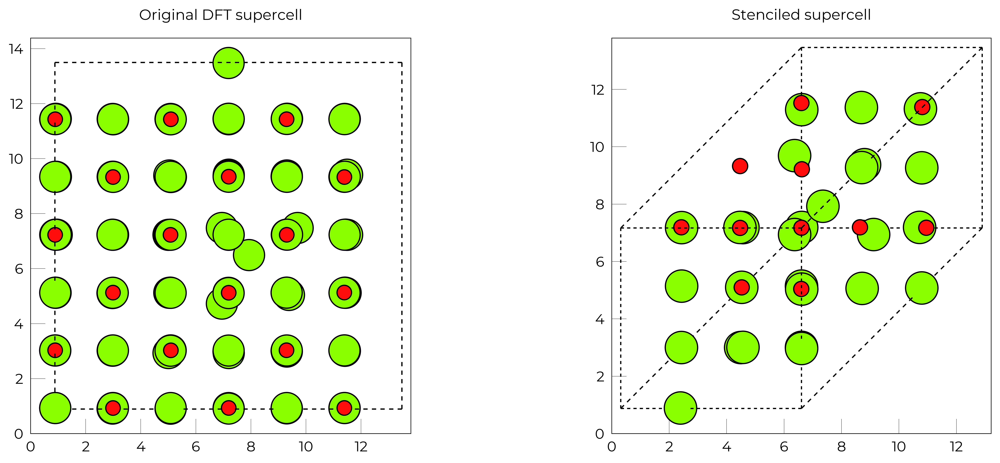

In [18]:
structure_fig = show_structures(mgo_entry.defect_supercell, stenciled_MgO)

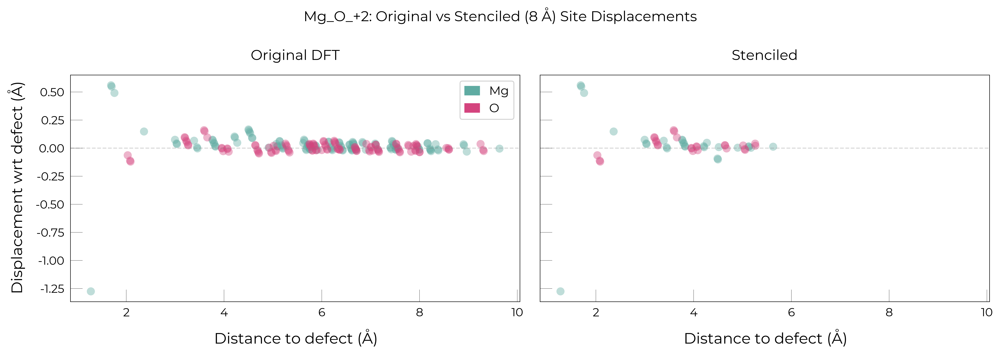

In [19]:
stenciled_MgO_entry = make_stenciled_defect_entry(mgo_entry, stenciled_MgO, bulk_MgO)
fig = plot_stenciled_vs_original_displacements(stenciled_MgO_entry, mgo_entry)
fig.suptitle(
    "Mg_O_+2: Original vs Stenciled (8 Å) Site Displacements", fontsize=14
)
plt.tight_layout()
plt.show()

## 5. Stenciling Algorithm and Advanced Options

The `get_defect_in_supercell` function provides several optional parameters for controlling the
stenciling behaviour, which may be useful to tune in tricky/edge cases which fail with the default parameters. These are rarely needed for typical use cases, however.

Moreover, the specific stenciling algorithm used (which is far from trivial to implement, to fully account for displacements near cell boundaries etc...) is described in the [`get_defect_in_supercell` docstring](https://doped.readthedocs.io/en/latest/doped.utils.html#doped.utils.stenciling.get_defect_in_supercell):

In [ ]:
# run this cell to see the function docstring, detailing optional parameters 
# and summarising the stenciling algorithm:
get_defect_in_supercell?

```{note}
`get_defect_in_supercell` returns a tuple `(stenciled_defect_supercell, corresponding_bulk_supercell)`. The `corresponding_bulk_supercell` is the bulk supercell that matches the basis/tiling of the stenciled defect supercell. In most cases this will be identical to the input `target_supercell`, but in some cases (where the original and target supercells have incommensurable primitive cell tilings) the basis may differ slightly (in which case a warning is emitted, so no need to worry about this unless warned). 
If this basis mis-match occurs, the returned bulk supercell should be used as the reference when parsing the stenciled defect calculation with `DefectsParser`, rather than the raw `target_supercell`, to ensure correct defect site-matching and finite-size corrections.
```